<a href="https://colab.research.google.com/github/Harsha1818/Image-Classification-Under-Attack-InceptionV3/blob/main/IntroToCV_blog2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Resizing Image B to match Image A's dimensions
Displaying Blended Image - Step 0


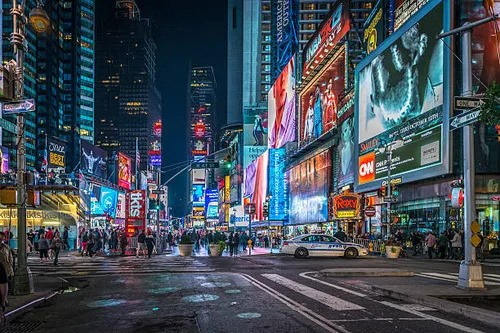

Displaying Blended Image - Step 1


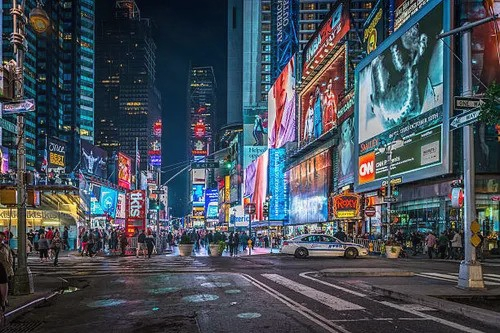

Displaying Blended Image - Step 2


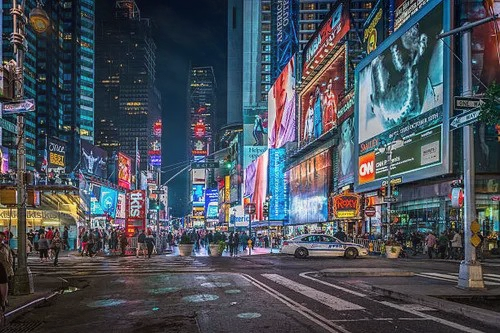

Displaying Blended Image - Step 3


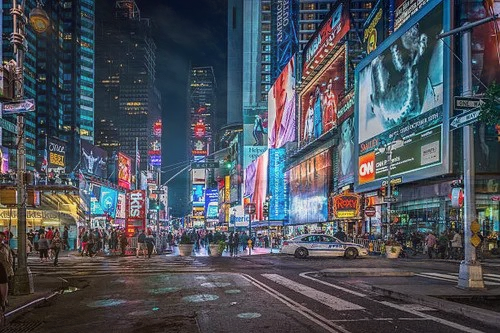

Displaying Blended Image - Step 4


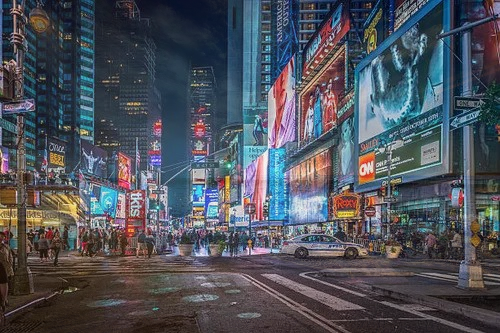

Displaying Blended Image - Step 5


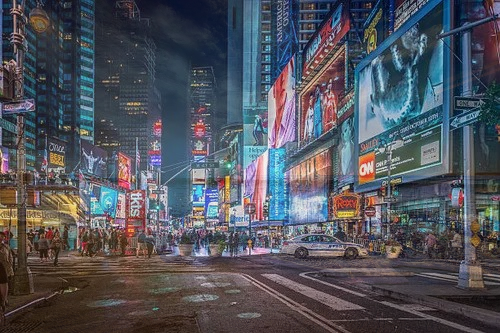

Displaying Blended Image - Step 6


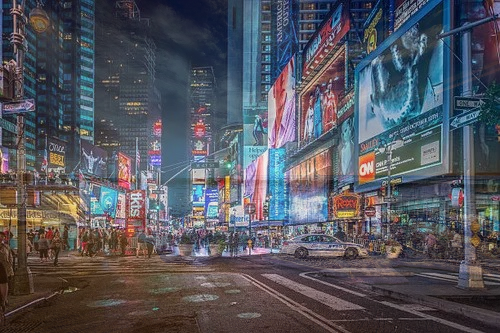

Displaying Blended Image - Step 7


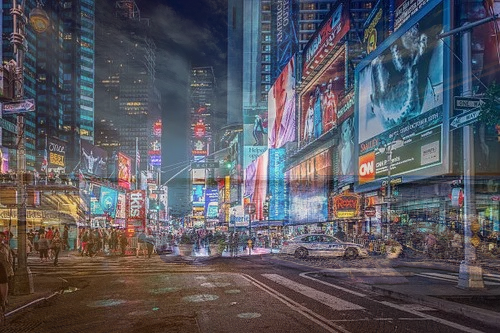

Displaying Blended Image - Step 8


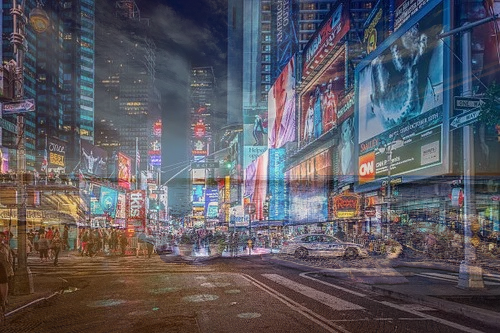

Displaying Blended Image - Step 9


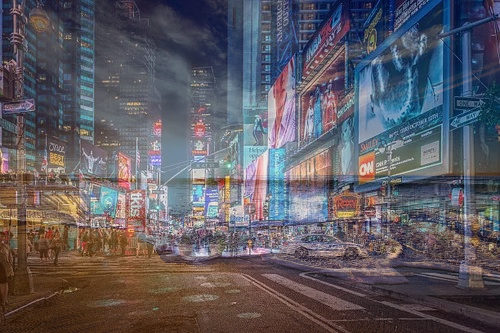

Displaying Blended Image - Step 10


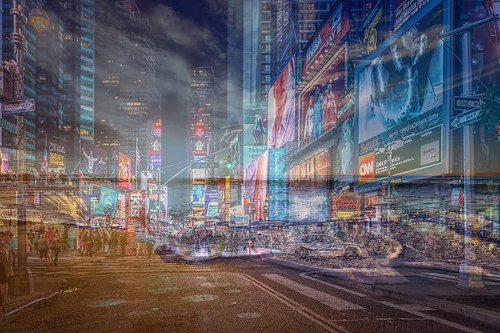

Displaying Blended Image - Step 11


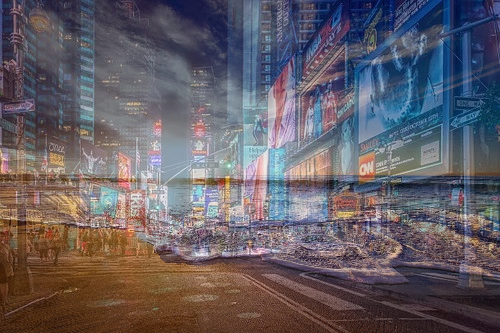

Displaying Blended Image - Step 12


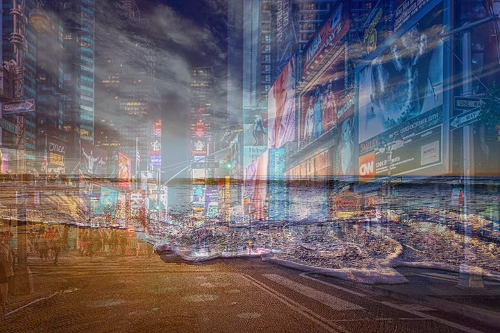

Displaying Blended Image - Step 13


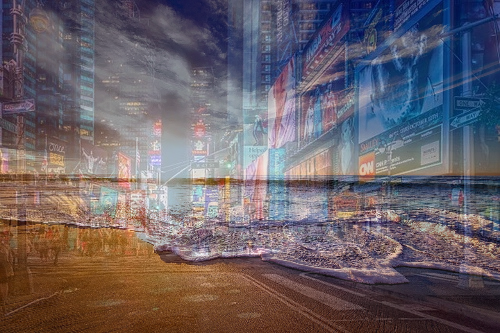

Displaying Blended Image - Step 14


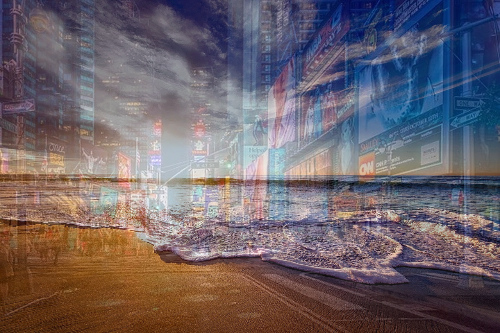

Displaying Blended Image - Step 15


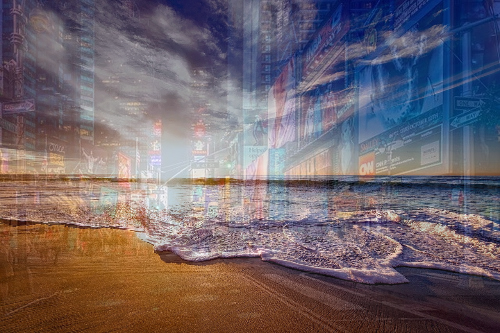

Displaying Blended Image - Step 16


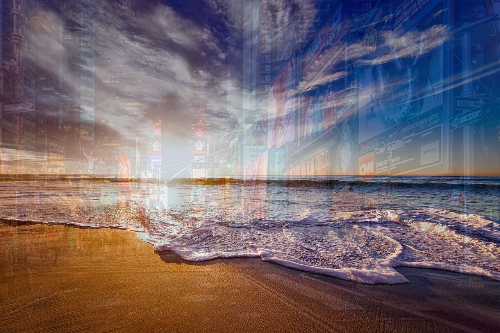

Displaying Blended Image - Step 17


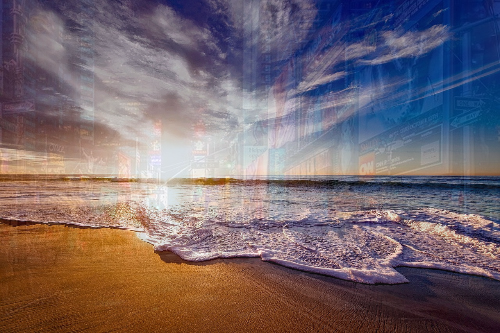

Displaying Blended Image - Step 18


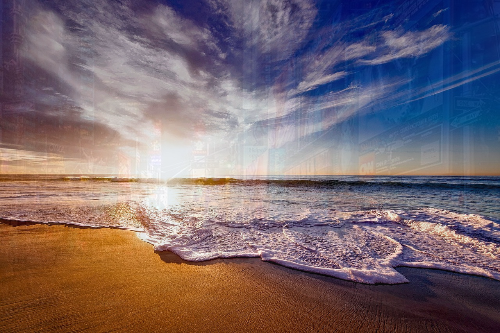

Displaying Blended Image - Step 19


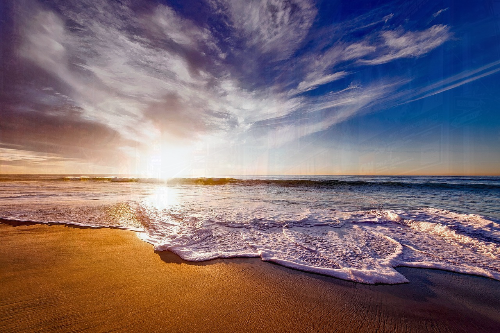

Displaying Blended Image - Step 20


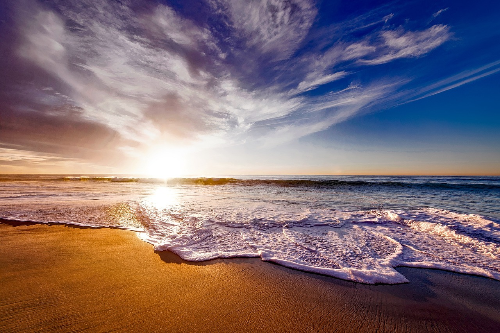

In [1]:
import cv2
import os
from google.colab.patches import cv2_imshow  # For image display in Colab
import tensorflow as tf
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input, decode_predictions
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

# Load Image A and Image B with full paths
image_A_path = "image_A.JPG"
image_B_path = "image_B.JPG"
# Load the images
image_A = cv2.imread(image_A_path)
image_B = cv2.imread(image_B_path)

# Check if images were loaded correctly
if image_A is None:
    print(f"Error: Image A not found at {image_A_path}")
    exit()
if image_B is None:
    print(f"Error: Image B not found at {image_B_path}")
    exit()

# Ensure both images have the same size
if image_A.shape != image_B.shape:
    print("Resizing Image B to match Image A's dimensions")
    image_B = cv2.resize(image_B, (image_A.shape[1], image_A.shape[0]))

# Number of blending steps
num_steps = 20

# Directory to save the blended images
output_dir = "blended_images/"
os.makedirs(output_dir, exist_ok=True)  # Ensure the directory exists

# Lists to store images and their corresponding alpha values
blended_images = []

# Perform blending with different alpha values
for i in range(num_steps + 1):
    alpha = i / num_steps  # Progressively increase alpha from 0 to 1
    beta = 1.0 - alpha     # Complementary weight for Image A

    # Blend the images using cv2.addWeighted
    blended_image = cv2.addWeighted(image_A, beta, image_B, alpha, 0)
    blended_images.append(blended_image)

    # Save the blended image to disk
    output_path = f"{output_dir}blend_step_{i}.jpg"
    cv2.imwrite(output_path, blended_image)

    # Display the blended image in Colab (optional)
    print(f"Displaying Blended Image - Step {i}")
    cv2_imshow(blended_image)
    cv2.waitKey(500)


In [2]:
model = InceptionV3(weights='imagenet')

# Classes of interest
target_classes = ['seashore', 'cab', 'streetcar', 'toyshop', 'lakeside', 'street_sign']
confidence_scores = {class_name: [] for class_name in target_classes}
predicted_classes = []  # List to store predicted class for each image

# Function to preprocess the image and get predictions
def classify_image(img, img_name):
    # Resize the image to (299, 299)
    img_resized = cv2.resize(img, (299, 299))

    # Convert the image to a numpy array and preprocess
    img_array = np.expand_dims(img_resized, axis=0)
    img_array = preprocess_input(img_array)

    # Perform prediction using the model
    predictions = model.predict(img_array)
    decoded_predictions = decode_predictions(predictions, top=3)[0]  # Get top 3 predictions

    # Print the predictions in the specified format
    print(f"Predictions for {img_name}:")
    for idx, (imagenet_id, label, score) in enumerate(decoded_predictions):
        print(f"{idx + 1}: {label} (confidence: {score * 100:.2f}%)")

    # Store confidence scores for target classes
    for class_name in target_classes:
        found = False
        for imagenet_id, label, score in decoded_predictions:
            if label == class_name:
                confidence_scores[class_name].append(score * 100)  # Convert to percentage
                found = True
                break
        # If the class is not found in top predictions, append 0 confidence
        if not found:
            confidence_scores[class_name].append(0.0)

    # Store the top predicted class
    predicted_classes.append(decoded_predictions[0][1])  # The top-1 class

# Classify the blended images and store confidence scores
for i, blended_image in enumerate(blended_images):
    img_name = f"blend_step_{i}.jpg"
    classify_image(blended_image, img_name)

# Calculate and print the detailed accuracy:
true_label = "seashore"  # Assuming true label is 'seashore' for this example
correct_predictions = sum(1 for pred in predicted_classes if pred == true_label)
accuracy = (correct_predictions / len(predicted_classes)) * 100
print(f"Accuracy for class '{true_label}': {accuracy:.2f}%")

96112376/96112376 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
35363/35363 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Predictions for blend_step_0.jpg:
1: cab (confidence: 67.65%)
2: street_sign (confidence: 4.52%)
3: streetcar (confidence: 2.53%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step
Predictions for blend_step_1.jpg:
1: cab (confidence: 61.47%)
2: street_sign (confidence: 5.62%)
3: streetcar (confidence: 3.42%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step
Predictions for blend_step_2.jpg:
1: cab (confidence: 53.01%)
2: street_sign (confidence: 8.14%)
3: streetcar (confidence: 3.95%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step
Predictions for blend_step_3.jpg:
1: cab (confidence: 47.90%)
2: street_sign (confidence: 9.58%)
3: streetcar (confidence: 4.31%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step
Predictions for blend_step_4.jpg:
1: cab (confidence: 41.65%)
2: street_sign (confidence: 9.95%)
3: streetcar (confidence: 4.72%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step
Predictions for blend_s

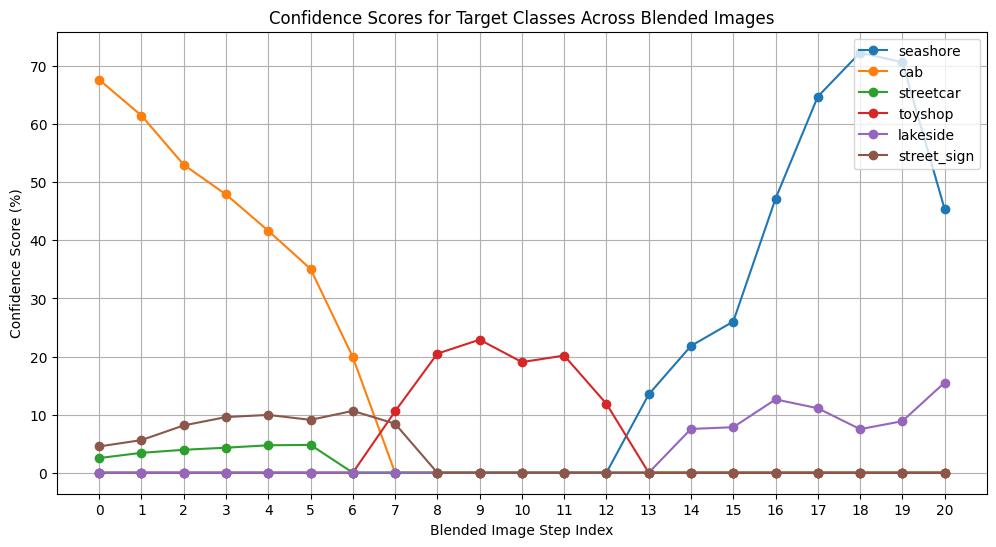

In [ ]:
plt.figure(figsize=(12, 6))

# Prepare the x-axis values (0 to 20)
x_values = np.arange(0, num_steps + 1, 1)

# Plot confidence for each target class
for class_name in target_classes:
    plt.plot(x_values, confidence_scores[class_name], label=class_name, marker='o')

# Configure plot
plt.title("Confidence Scores for Target Classes Across Blended Images")
plt.xlabel("Blended Image Step Index")
plt.ylabel("Confidence Score (%)")
plt.xticks(ticks=np.arange(0, num_steps + 1, 1))  # Set x-axis ticks from 0 to 20
plt.legend(loc="upper right")
plt.grid(True)

# Show the plot
plt.show()